# Homework 3 Solution

**MECH.5130: Theory of Finite Element Analysis**

Michael N. Olaya

## Problem 1

### Unit tests

Unit tests were designed for:

- Shape function matrix verification (N)
- Shape function derivative matrix verification (dN)
- Full Jacobian matrix verification (J)
- B matrix verification (B)
- Visual inspection of (in both the local element and natural coordinate systems)...
    - Element shape functions
    - Element displacements
    - Element Jacobian
    - Element strains
    - Element stresses

For unit test implementations, refer to [`tests.py`](../../mfe/tests.py). Specific checks and their pass/fail status are printed to the console once invoked as demonstrated in the code blocks below.

In [24]:
import numpy as np
import matplotlib.pyplot as plt

import mfe.plot
import mfe.utils
import mfe.tests
from mfe.baseclasses import Material
from mfe.elem_lib import Linear2D, Quadratic2D

In [25]:
# Create the elements, nodal displacements, material properties, and grid size
ELEMENTS = {
    'linear': {
        'elem': Linear2D.from_element_coords(
            [
                np.array([0, 0]), 
                np.array([12, -1]), 
                np.array([15, 8]), 
                np.array([-1, 10])]
        ),
        'q': np.array([0, 0, 0.1, -0.1, 0.1, 0.1, -0.1, 0.1])
    },
    'quad': {
        'elem': Quadratic2D.from_element_coords(
            [
                np.array([0, 0]), 
                np.array([6, 0.5]), 
                np.array([12, -1]),
                np.array([11, 5]),
                np.array([15, 8]),
                np.array([6, 11]),
                np.array([-1, 10]),
                np.array([1, 5]),
            ]
        ),
        'q': np.array([0, 0, 0.1, -0.1, 0.2, -0.3, 0.2, -0.3, 0.2, -0.3, 0.1, -0.1, 0.0, 0.1, 0.0, 0.0])
    },
}
MATERIALS = {
    'aluminum': Material(E=70000, nu=0.33)
}
NGRID = 50

#### 4-noded, 2D element

In [26]:
# Get element and run all tests
elem = ELEMENTS['linear']['elem']
q = ELEMENTS['linear']['q']
mfe.tests.test_2D_shape_functions(elem, NGRID)
mfe.tests.test_2D_shape_function_derivatives(elem, NGRID)
mfe.tests.test_2D_jacobian(elem, NGRID)
mfe.tests.test_2D_B_matrix(elem, NGRID)

*running test: 2D shape function (N) verification
-checking: shape of N matrix
-checking: sum of shape functions
-checking: N matrix zero-valued elements
-checking: N matrix components equivalence with corresponding nodal shape function
-checking: N matrix row equivalence
**test passed: shape function matrix (N)

*running test: 2D shape function derivative matrix (dN) verification
-checking: shape of dN matrix
-checking: sum of shape function derivatives
-checking: dN matrix zero-valued elements
-checking: dN matrix components equivalence with corresponding nodal shape function derivatives in each coordinate direction
-checking: dN matrix row equivalence
**test passed: 2D shape function derivative matrix (dN) verification

*running test: 2D full Jacobian matrix (J) verification
-checking: shape of full J matrix
-checking: upper left, lower right quadrant of full J matrix equivalence
-checking: upper right, lower left quadrant of full J matrix equivalence
-checking: upper right quadrant

#### 8-noded, 2D element

In [27]:
# Get element and run all tests
elem = ELEMENTS['quad']['elem']
q = ELEMENTS['quad']['q']
mfe.tests.test_2D_shape_functions(elem, NGRID)
mfe.tests.test_2D_shape_function_derivatives(elem, NGRID)
mfe.tests.test_2D_jacobian(elem, NGRID)
mfe.tests.test_2D_B_matrix(elem, NGRID)

*running test: 2D shape function (N) verification
-checking: shape of N matrix
-checking: sum of shape functions
-checking: N matrix zero-valued elements
-checking: N matrix components equivalence with corresponding nodal shape function
-checking: N matrix row equivalence
**test passed: shape function matrix (N)

*running test: 2D shape function derivative matrix (dN) verification
-checking: shape of dN matrix
-checking: sum of shape function derivatives
-checking: dN matrix zero-valued elements
-checking: dN matrix components equivalence with corresponding nodal shape function derivatives in each coordinate direction
-checking: dN matrix row equivalence
**test passed: 2D shape function derivative matrix (dN) verification

*running test: 2D full Jacobian matrix (J) verification
-checking: shape of full J matrix
-checking: upper left, lower right quadrant of full J matrix equivalence
-checking: upper right, lower left quadrant of full J matrix equivalence
-checking: upper right quadrant

## Problem 2

![key_funcs](../figs/hw3_funcs.png)
![key_unittests](../figs/hw3_unittests.png)
![bubble_charts_funcs](../figs/hw3_bubble_charts_funcs.png)
![bubble_charts_unittests](../figs/hw3_bubble_charts_unittests.png)

## Problem 3

### compute_dN

```Python
# Input: 
    # natural_grid: ndarray (n x m x 2 x 1)
# Compute shape function derivatives for the grid of coordinates, two per node (derivative with respect to 1- and 2- directions)
# Assemble [dN] from dN_ij
# Output: 
    # ndarray (n x m x 4 x 2*nnodes)
```

### compute_J

```Python
# Input: 
    # dN: ndarray (n x m x 4 x 2*nnodes)
# Create array of nodal coordinates [q] in the element coordinate system
# Compute Jacobian in column vector form [J_col] = [dN][q]
# Assemble [J] for the grid from components of [J_col]
# Output: 
    # ndarray (n x m x 4 x 4)
```

### compute_B_matrix

```Python
# Input: 
    # dN: ndarray (n x m x 4 x 2*nnodes)
    # J: ndarray (n x m x 4 x 4)
# Compute [B] = [A_2D][J]^-1[dN]
    # [A_2D] is a constant ndarray (3 x 4)
# Output: 
    # ndarray (n x m x 3 x 2*nnodes)
```

### compute_D_isotropic_plane_strain

```Python
# Input: 
    # E: float
    # nu: float
# Compute components of [D] for an isotropic plane strain material
# Output: 
    # ndarray (3 x 3)
```

### compute_D_isotropic_plane_stress

```Python
# Input: 
    # E: float
    # nu: float
# Compute components of [D] for an isotropic plane stress material
# Output: 
    # ndarray (3 x 3)
```

### compute_strain

```Python
# Input: 
    # B: ndarray (n x m x 3 x 2*nnodes)
    # q: ndarray (n x m x 2*nnodes x 1)
# Compute strain [eps] = [B][q]
# Output: 
    # ndarray (n x m x 3 x 1)
```

### compute_stress

```Python
# Input: 
    # D: ndarray (n x m x 3 x 3)
    # eps: ndarray (n x m x 2*nnodes x 1)
# Compute stress [sigma] = [D][eps]
# Output: 
    # ndarray (n x m x 3 x 1)
```

### test_2D_shape_functions

```Python
# Input: 
    # elem: mfe.baseclasses.Element2D
    # (Optional) ngrid: int
# Make natural coordinate grid
# Compute [N]
# Check shape of [N]
# Check sum of shape functions at each point on the grid
# Check zero-valued components of [N]
# Check [N] components match independently calculated values
# Check first and second rows match when shifted  
# Output:
    # None
```

### test_2D_shape_function_derivatives

```Python
# Input: 
    # elem: mfe.baseclasses.Element2D
    # (Optional) ngrid: int
# Make natural coordinate grid
# Compute [dN]
# Check shape of [dN]
# Check sum of shape functions at each point on the grid
# Check zero-valued components of [dN]
# Check [dN] components match independently calculated values
# Check first and third rows, second and fourth rows match when shifted  
# Output:
    # None
```

### test_2D_jacobian

```Python
# Input: 
    # elem: mfe.baseclasses.Element2D
    # (Optional) ngrid: int
# Make natural coordinate grid
# Compute [dN]
# Compute [J]
# Check shape of [J]
# Check quadrants of [J]
# Check [J] evaluated when assembled from node coordinates in natural coordinate system
# Output:
    # None
```

### inspect_2D_element

```Python
# Input: 
    # elem: mfe.baseclasses.Element2D
    # D: ndarray (3 x 3)
    # q: ndarray (2*nnodes x 1)
    # (Optional) ngrid: int
# Make natural coordinate grid
# Map element nodal coordiantes in element coordinate system
# Compute [N]
# Map [u] in the element
# Compute [dN]
# Compute [J]
# Compute [eps]
# Compute [sigma]
# Make contour plots for various quantities: [N], [u], [J], [eps], [sigma] 
# Output:
    # Figures
```

## Problem 4

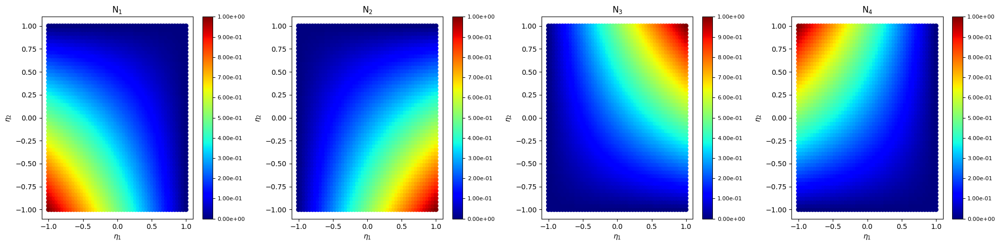

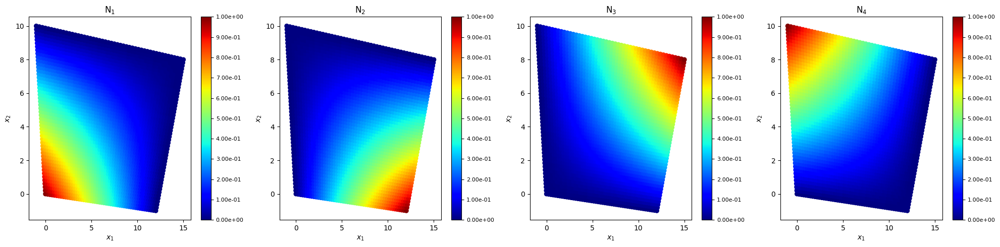

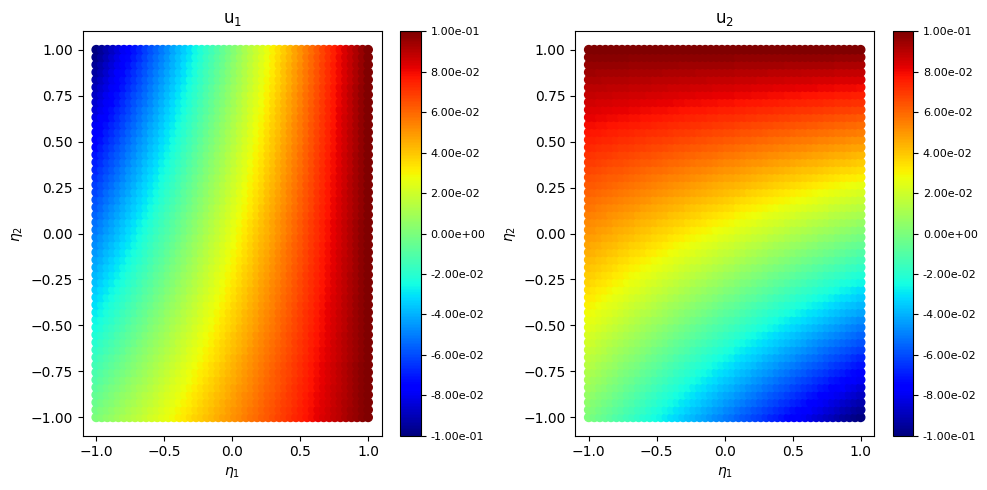

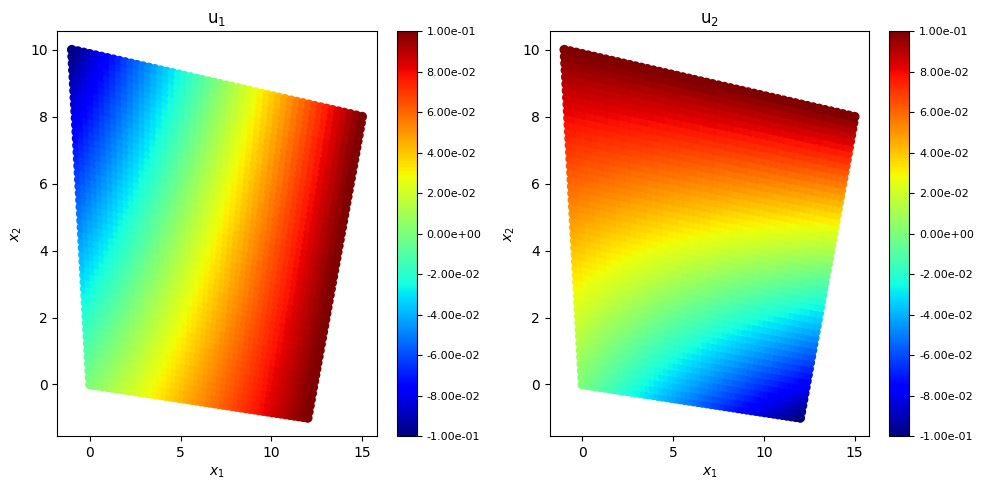

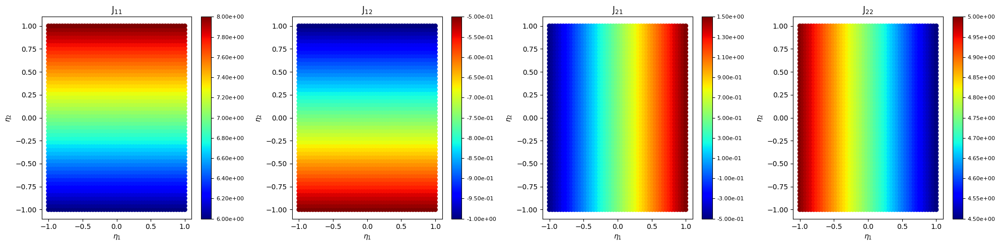

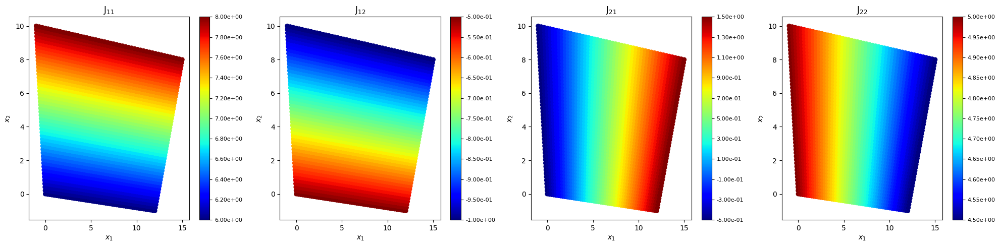

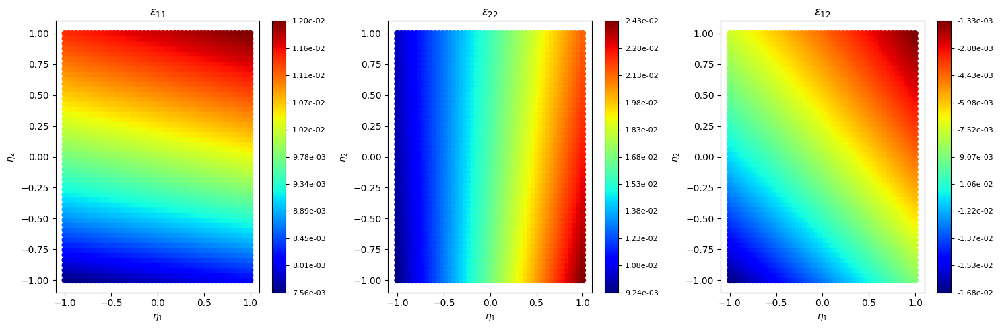

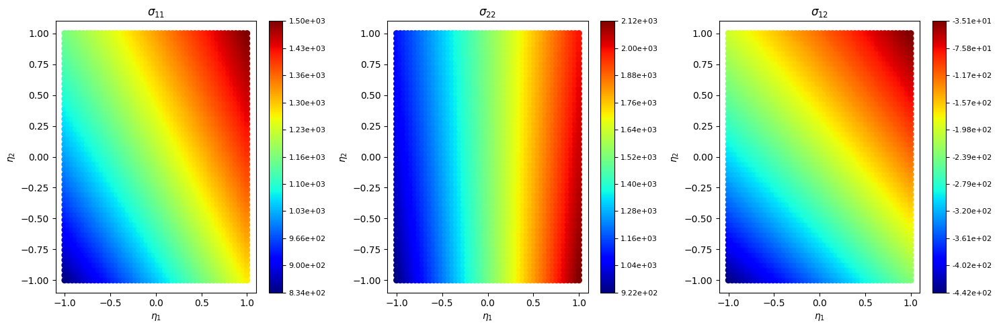

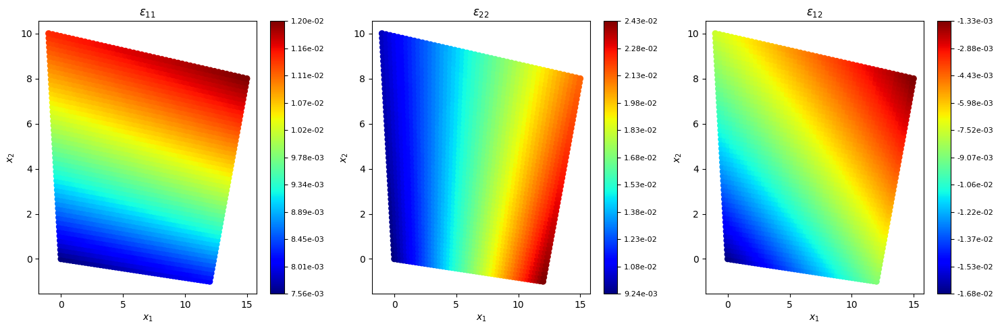

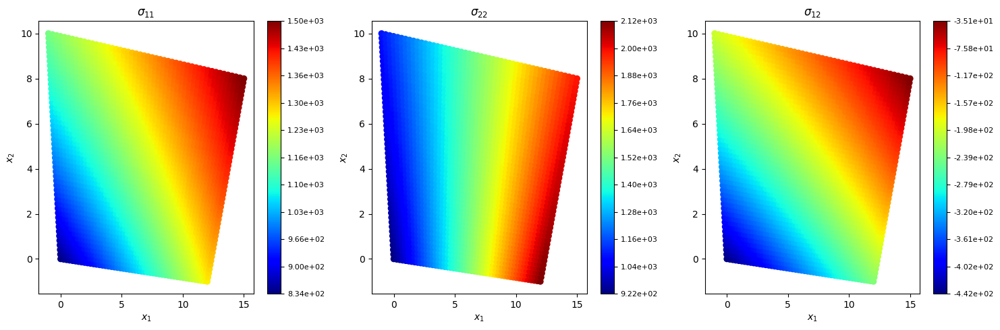

In [28]:
# Visual inspection of the element when using a plane stress formulation
elem = ELEMENTS['linear']['elem']
q = ELEMENTS['linear']['q']
mat = MATERIALS['aluminum']
D = mat.D_isotropic_plane_stress()
figs = mfe.tests.inspect_2D_element(elem, D, q)

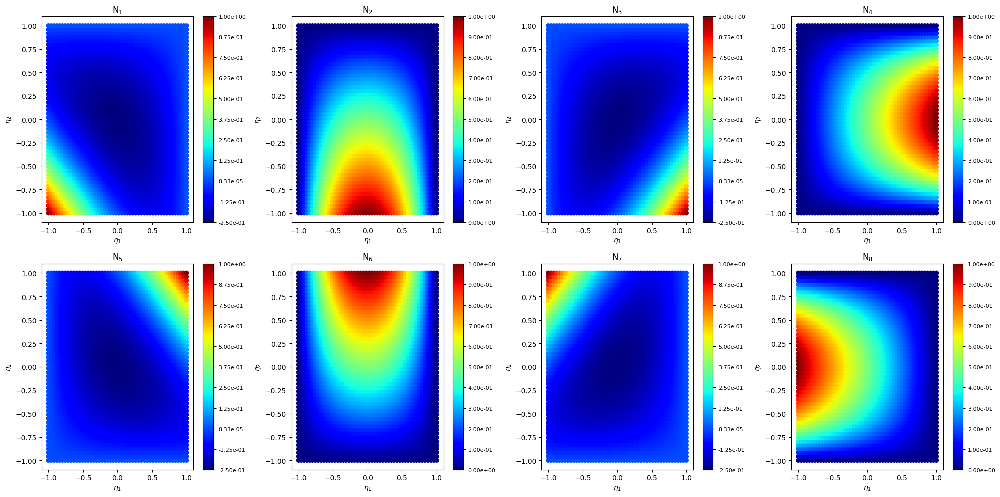

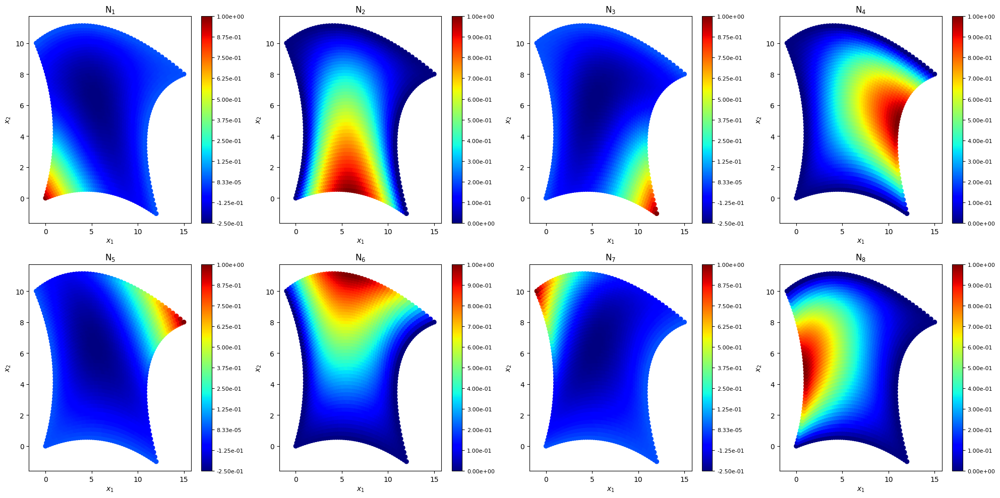

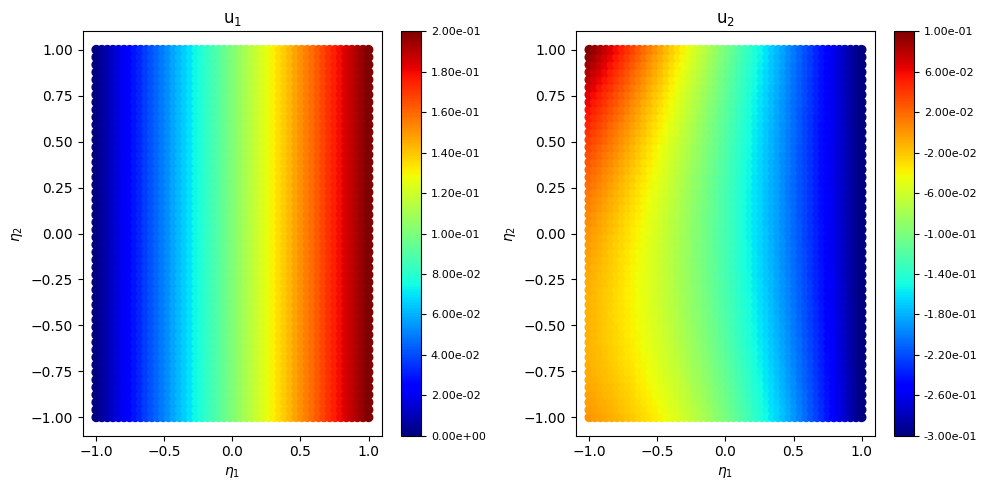

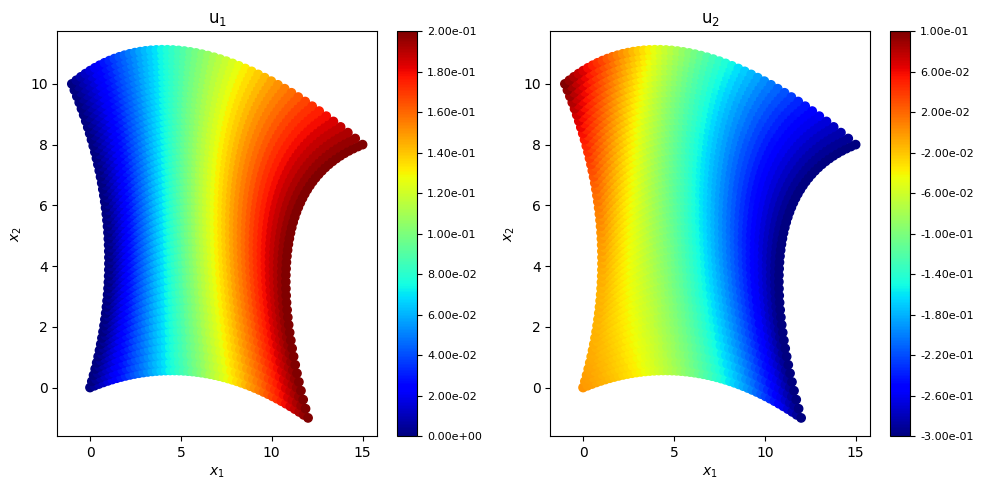

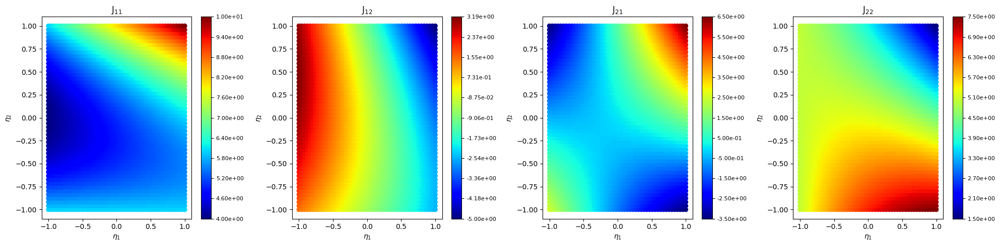

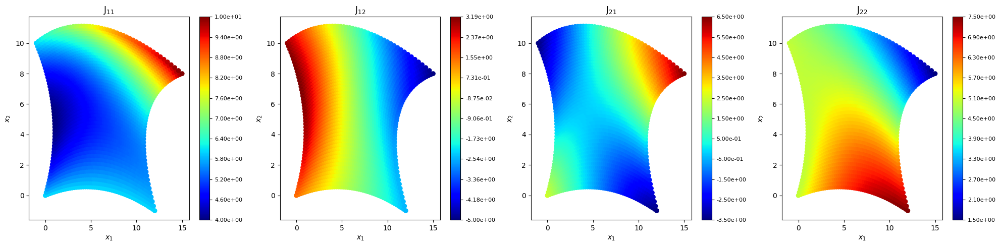

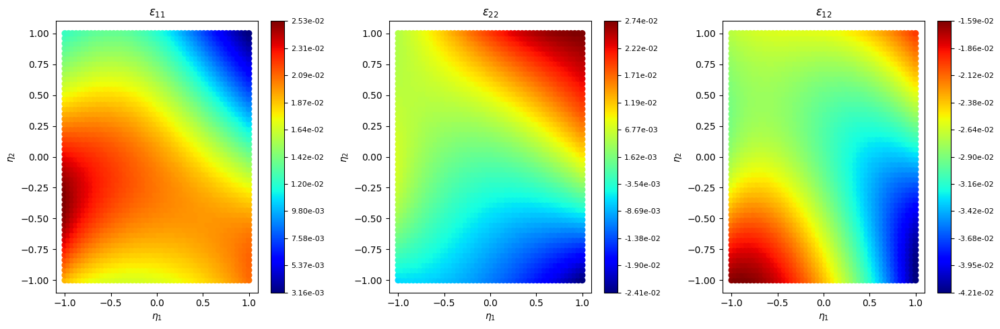

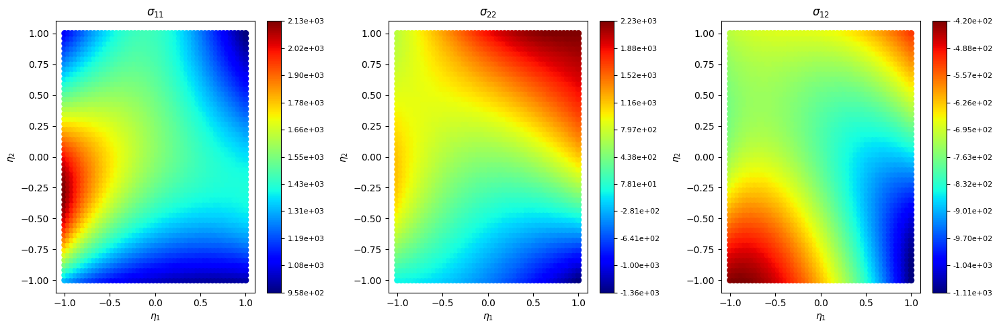

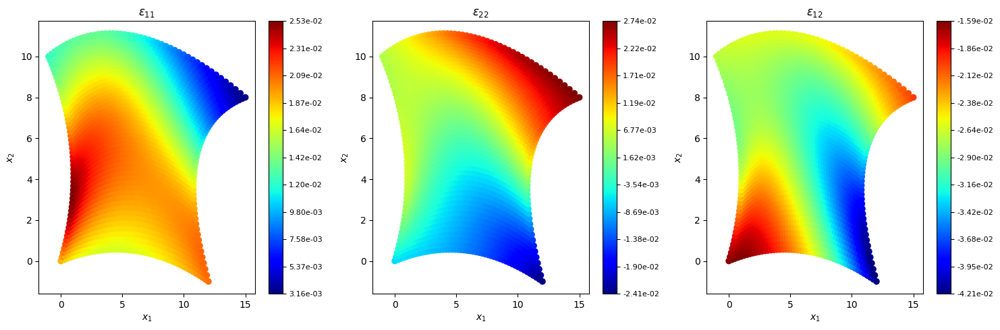

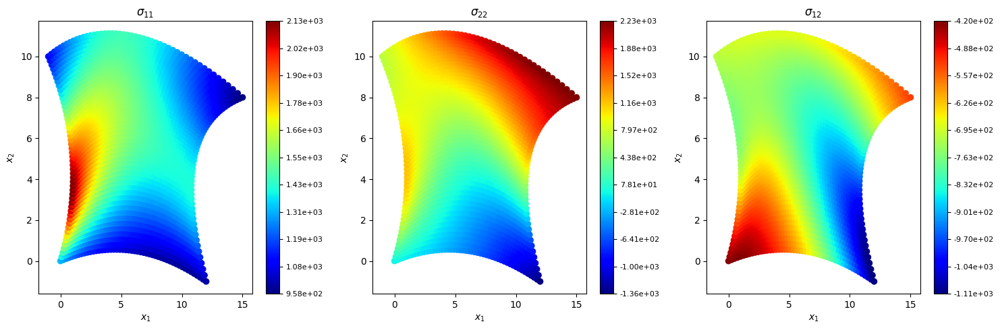

In [29]:
# Visual inspection of the element when using a plane stress formulation
elem = ELEMENTS['quad']['elem']
q = ELEMENTS['quad']['q']
mat = MATERIALS['aluminum']
D = mat.D_isotropic_plane_stress()
figs = mfe.tests.inspect_2D_element(elem, D, q)

## Problem 5

In [30]:
# Creating an element with small angles between nodes -> swap node positions 
ELEMENTS = {
    'linear': {
        'elem': Linear2D.from_element_coords(
            [
                np.array([0, 0]), 
                np.array([15, 8]), 
                np.array([12, -1]), 
                np.array([-1, 10])]
        ),
        'q': np.array([0, 0, 0.1, -0.1, 0.1, 0.1, -0.1, 0.1])
    },
    'quad': {
        'elem': Quadratic2D.from_element_coords(
            [
                np.array([0, 0]), 
                np.array([6, 0.5]), 
                np.array([12, -1]),
                np.array([11, 5]),
                np.array([6, 11]),
                np.array([15, 8]),
                np.array([-1, 10]),
                np.array([1, 5]),
            ]
        ),
        'q': np.array([0, 0, 0.1, -0.1, 0.2, -0.3, 0.2, -0.3, 0.2, -0.3, 0.1, -0.1, 0.0, 0.1, 0.0, 0.0])
    },
}
MATERIALS = {
    'aluminum': Material(E=70000, nu=0.33)
}
NGRID = 50

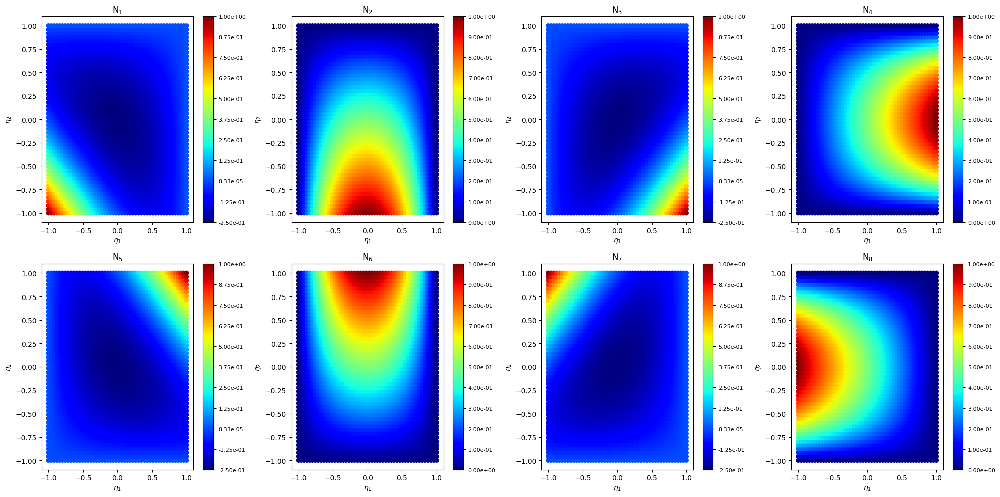

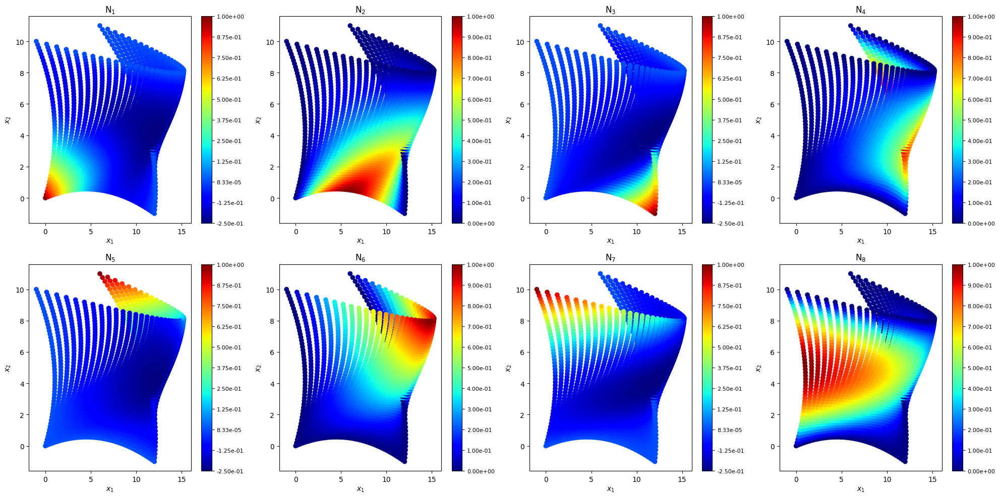

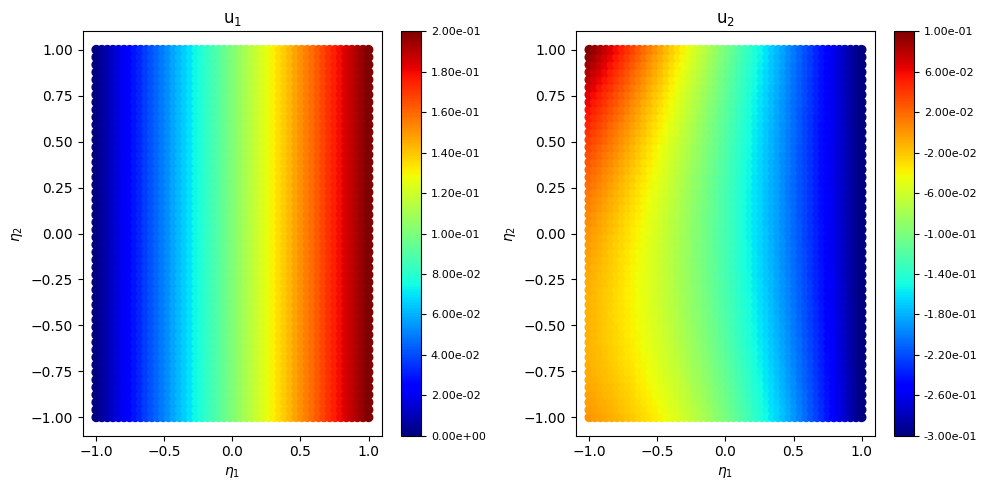

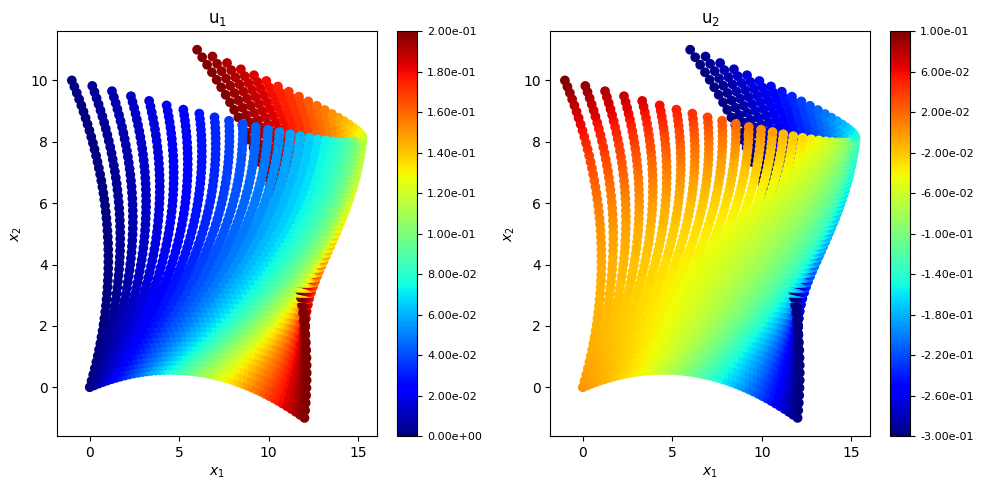

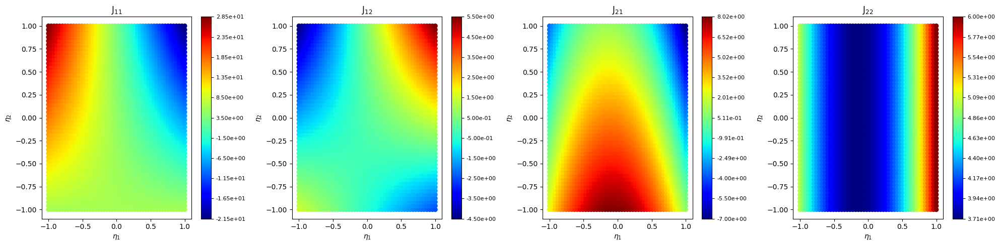

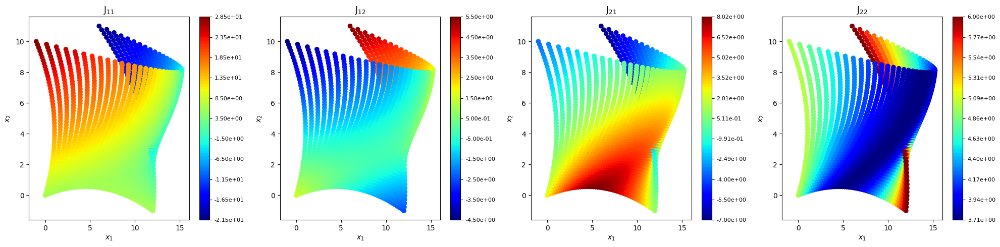

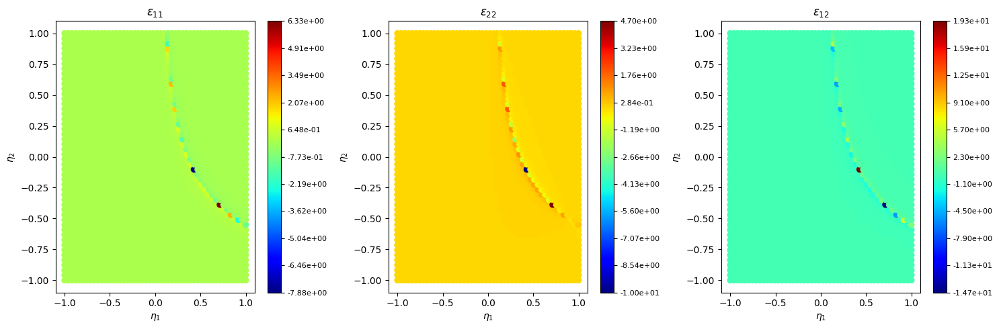

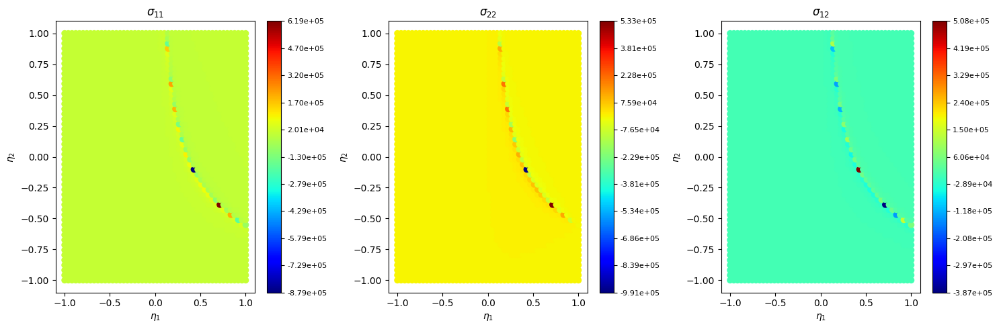

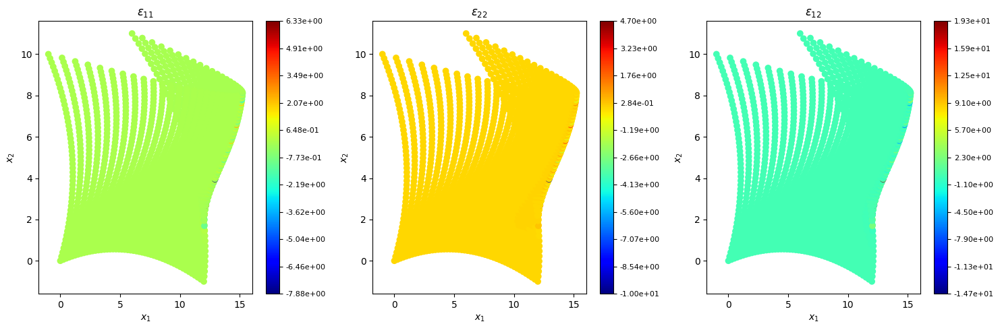

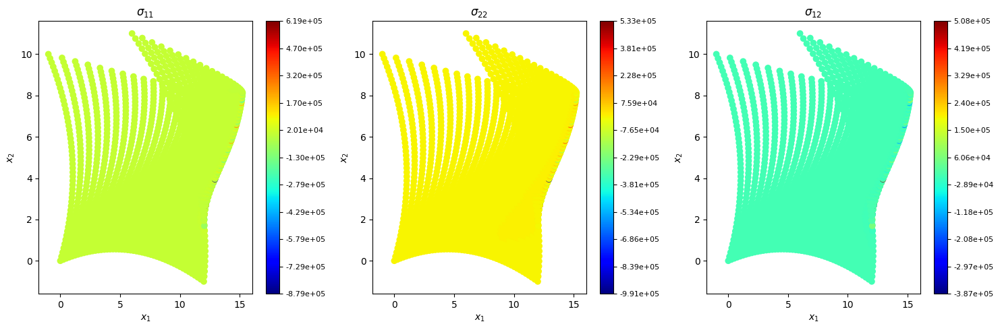

: 

In [31]:
# Visual inspection of the element when using a plane stress formulation
elem = ELEMENTS['quad']['elem']
q = ELEMENTS['quad']['q']
mat = MATERIALS['aluminum']
D = mat.D_isotropic_plane_stress()
figs = mfe.tests.inspect_2D_element(elem, D, q)